# **"Shirt Color Prediction Using YOLOv8"**

### The purpose of this notebook is to test the YOLOv8 model for shirt color prediction.

#### **Libraries Used:** 
>ultralytics

>matplotlib.pyplot

>cv2

#### **What is ultralytics library?**
>Ultralytics is a library for object detection, segmentation, and instance segmentation. It is used for image and video analysis.

#### **How to use?**

>1. Load the best weights of YOLOv8 model trained on the custom shirts data

>2. Store the predictions of model

>3. Using different scripts, test it on images, videos and live feed


# +_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+_+

## **Install ultralytics**

In [1]:
!pip install ultralytics

## **Load the best weights of trained YOLO**

In [2]:
from ultralytics import YOLO

model = YOLO("best100.pt")

## **Test model on image files**

In [ ]:
import matplotlib.pyplot as plt
import cv2
from ultralytics import YOLO

model = YOLO("best20.pt")

# Load the image
image_path = r'C:\Users\majid\Downloads\train8 (1)\cart_testing\DSC_0971.JPG'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

# Make predictions
results = model.predict(source=image_path)

# Plot the image with predictions
fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(image)
ax.axis('off')  # Hide axes
ax.set_title('Predictions on Image')

# Plot the bounding boxes and labels
for result in results:
    boxes = result.boxes
    for box in boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='green', linewidth=2))
        label = f"{result.names[int(box.cls[0])]}: {box.conf[0]:.2f}"
        ax.text(x1, y1, label, fontsize=6, color='white', bbox=dict(facecolor='green', edgecolor='green', alpha=0.6))

plt.show()

## **Using Paddle OCR**

In [4]:
pip install paddlepaddle

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.1 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
pip install paddleocr

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.1 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from paddleocr import PaddleOCR
import shutil

# Clear PaddleOCR cache
cache_dir = os.path.expanduser('~/.paddleocr/')
if os.path.exists(cache_dir):
    shutil.rmtree(cache_dir)

# Initialize PaddleOCR
ocr = PaddleOCR(use_angle_cls=True, lang='en')  # Specify the language you want to use

# Set the folder path containing the images
folder_path = 'cart_testing'

# Create a list to store the extracted license plate texts
extracted_texts = []

# Get the list of image files in the folder
image_files = [filename for filename in os.listdir(folder_path) if filename.endswith(('.JPG', '.png', '.jpeg', '.webp','jpg'))]
num_images = len(image_files)

download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to C:\Users\majid/.paddleocr/whl\det\en\en_PP-OCRv3_det_infer\en_PP-OCRv3_det_infer.tar


100%|██████████| 4.00M/4.00M [00:18<00:00, 215kiB/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to C:\Users\majid/.paddleocr/whl\rec\en\en_PP-OCRv4_rec_infer\en_PP-OCRv4_rec_infer.tar


100%|██████████| 10.2M/10.2M [00:28<00:00, 363kiB/s] 


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to C:\Users\majid/.paddleocr/whl\cls\ch_ppocr_mobile_v2.0_cls_infer\ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:32<00:00, 67.4kiB/s]

[2024/08/01 04:57:25] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\majid/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\majid/.paddleocr/whl\\rec\\en\\en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=


image 1/1 c:\Users\majid\Downloads\train8 (1)\cart_testing\DSC_0968.JPG: 576x640 1 Number-Plate, 141.0ms
Speed: 6.0ms preprocess, 141.0ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 640)
[2024/07/31 13:23:18] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.18035173416137695
[2024/07/31 13:23:18] ppocr DEBUG: cls num  : 2, elapsed : 0.013804912567138672
[2024/07/31 13:23:19] ppocr DEBUG: rec_res num  : 2, elapsed : 0.28300023078918457

image 1/1 c:\Users\majid\Downloads\train8 (1)\cart_testing\DSC_0969.JPG: 544x640 1 Number-Plate, 94.0ms
Speed: 6.0ms preprocess, 94.0ms inference, 2.0ms postprocess per image at shape (1, 3, 544, 640)
[2024/07/31 13:23:19] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.016997814178466797
[2024/07/31 13:23:19] ppocr DEBUG: cls num  : 2, elapsed : 0.011999368667602539
[2024/07/31 13:23:19] ppocr DEBUG: rec_res num  : 2, elapsed : 0.1680009365081787

image 1/1 c:\Users\majid\Downloads\train8 (1)\cart_testing\DSC_0970.JPG: 576x640 (no detections), 101

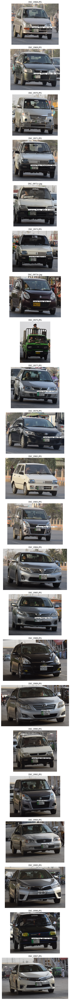

In [44]:
# Create a figure with subplots
fig, axes = plt.subplots(nrows=num_images, ncols=1, figsize=(12, 4 * num_images))

# Iterate over the images in the folder
for i, filename in enumerate(image_files):
    # Load the image
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

    # Make predictions using the YOLOv8 model (assuming `model` is initialized)
    results = model.predict(source=image_path)

    # Initialize a list to hold the detected text lines
    text_lines = []

    # Process each detection
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]  # Get the bounding box coordinates

            # Crop the license plate from the image
            license_plate = image_rgb[int(y1):int(y2), int(x1):int(x2)]

            # Apply OCR to the license plate image using PaddleOCR
            ocr_results = ocr.ocr(license_plate, cls=True)

            # Extract the text and confidence from the OCR results
            if ocr_results:
                for line in ocr_results[0]:  # Each line contains (box, (text, confidence))
                    _, (text, confidence) = line
                    text_lines.append(text)  # Append the detected text line

    # Join all detected lines into a single string
    full_text = ' '.join(text_lines)

    # Store the extracted license plate text in the list
    extracted_texts.append((filename, full_text))

    # Draw the bounding box and license plate text on the image
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]  # Get the bounding box coordinates
            cv2.rectangle(image_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 0), 2)
            y = int(y1) - 10 if int(y1) - 10 > 10 else int(y1) + 10
            
            # Add background to the text
            (text_width, text_height), _ = cv2.getTextSize(f'License Plate: {full_text}', 
                                                           cv2.FONT_HERSHEY_SIMPLEX, 1, 2)
            cv2.rectangle(image_rgb, (int(x1), y - text_height - 5), (int(x1 + text_width), y), 
                          (255, 255, 255), -1)
            
            # Draw the text with the background
            cv2.putText(image_rgb, f'License Plate: {full_text}', 
                        (int(x1), y), cv2.FONT_HERSHEY_SIMPLEX, 
                        1, (0, 0, 0), 2)

    # Display the image with OCR results in the subplot
    axes[i].imshow(image_rgb)
    axes[i].axis('off')
    axes[i].set_title(filename)

# Save the figure
plt.tight_layout()
plt.savefig('license_plate_detection_paddle.png')

# Create a DataFrame to store the extracted license plate texts
resultspaddle_df = pd.DataFrame(extracted_texts, columns=['Filename', 'License Plate'])


[2024/08/01 05:22:34] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\majid/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\majid/.paddleocr/whl\\rec\\en\\en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=

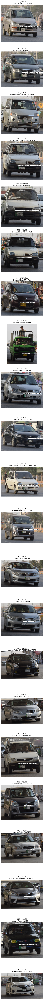

In [3]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from paddleocr import PaddleOCR
from ultralytics import YOLO
model = YOLO("best20.pt")
# Initialize PaddleOCR
ocr = PaddleOCR(use_angle_cls=True, lang='en')  # Specify the language you want to use
# Set the folder path containing the images
folder_path = 'cart_testing'
# Create a list to store the extracted license plate texts
extracted_texts = []
# Get the list of image files in the folder
image_files = [filename for filename in os.listdir(folder_path) if filename.endswith(('.jpg', '.png', '.jpeg', '.webp', '.JPG'))]
num_images = len(image_files)
# Create a figure with subplots
num_cols = 1  # Only one column
num_rows = num_images  # Number of rows equal to the number of images
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(5, 5 * num_rows))
# Iterate over the images in the folder
for i, filename in enumerate(image_files):
    # Load the image
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib
    # Make predictions using the YOLOv8 model
    results = model.predict(source=image_path)
    # Initialize a list to hold the detected text lines
    text_lines = []
    # Process each detection
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]  # Get the bounding box coordinates
            # Crop the license plate from the image
            license_plate = image_rgb[int(y1):int(y2), int(x1):int(x2)]
            # Apply OCR to the license plate image using PaddleOCR
            ocr_results = ocr.ocr(license_plate, cls=True)
            # Extract the text and confidence from the OCR results
            detected_text = ""
            if ocr_results and ocr_results[0]:  # Check if ocr_results is not None and not empty
                for line in ocr_results[0]:  # Each line contains (box, (text, confidence))
                    _, (text, confidence) = line
                    detected_text += text + " "  # Append the detected text line
            # Strip any trailing spaces
            detected_text = detected_text.strip()
            # Add text only if detected
            if detected_text:
                text_lines.append(detected_text)
                # Draw the bounding box and license plate text on the image
                cv2.rectangle(image_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 0), 3)
                y = int(y1) - 10 if int(y1) - 10 > 10 else int(y1) + 10
                # Add background to the text
                (text_width, text_height), _ = cv2.getTextSize(f'License Plate: {detected_text}',
                                                               cv2.FONT_HERSHEY_SIMPLEX, 1, 2)
                cv2.rectangle(image_rgb, (int(x1), y - text_height - 5), (int(x1 + text_width), y),
                              (255, 255, 255), -1)
                # Draw the text with the background
                cv2.putText(image_rgb, f'License Plate: {detected_text}',
                            (int(x1), y), cv2.FONT_HERSHEY_SIMPLEX,
                            1, (0, 0, 0), 2)
    # Join all detected lines into a single string for the title
    full_text = ' '.join(text_lines) if text_lines else "No text detected"
    # Store the extracted license plate text in the list
    extracted_texts.append((filename, full_text))
    # Display the image with OCR results in the subplot
    axes[i].imshow(image_rgb)
    axes[i].axis('off')
    axes[i].set_title(f"{filename}\nLicense Plate: {full_text}")
# Hide any unused subplots (though in this case, all should be used)
for j in range(i + 1, num_rows):
    axes[j].axis('off')
# Save the figure
plt.tight_layout()
plt.savefig('license_plate_detection_paddle.png')
# Create a DataFrame to store the extracted license plate texts
resultspaddletest_df = pd.DataFrame(extracted_texts, columns=['Filename', 'License Plate'])

In [5]:
resultspaddletest_df

,Filename,License Plate
0,DSC_0968.JPG,LEA-06 1856
1,DSC_0969.JPG,MNA-0 3685
2,DSC_0970.JPG,No text detected
3,DSC_0971.JPG,PKAIS-PCUCE VR287
4,DSC_0971x.jpg,MNA-B 2206
5,DSC_0973.JPG,MND15 464
6,DSC_0973x.jpg,BFM-731
7,DSC_0975.JPG,LET5280
8,DSC_0977.JPG,LEF-16 2640
9,DSC_0979.JPG,BRA-09 1408
